In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt

import torch
import torchvision
from torchvision import transforms
import ignite
from ignite.engine import create_supervised_evaluator

import backdoor_attack as bd
import backdoor_attack.plot_util
import net

In [2]:
# device setup
if torch.cuda.is_available():
    device = torch.device(type='cuda', index=1)
else:
    device = torch.device(type='cpu')

In [3]:
transform = transforms.Compose([
    transforms.ToTensor()
])

In [4]:
ds_root = os.path.join('.', 'results', 'datasets')
tr = np.load(os.path.join(ds_root, 'distillation_training_dataset.npz'))
#train_ds = bd.Dataset_from_array(x=tr['x'], t=tr['t'], transform=transform)
te = np.load(os.path.join(ds_root, 'clean_test_dataset.npz'))
test_ds = bd.Dataset_from_array(x=te['x'], t=te['t'], transform=transform)
te_p = np.load(os.path.join(ds_root, 'poison_test_dataset.npz'))
test_p_ds = bd.Dataset_from_array(x=te_p['x'], t=te_p['t_correct'], transform=transform)

#train_dl = torch.utils.data.DataLoader(train_ds, batch_size=128, shuffle=True)
test_dl = torch.utils.data.DataLoader(test_ds, batch_size=128, shuffle=False)
test_p_dl = torch.utils.data.DataLoader(test_p_ds, batch_size=128, shuffle=False)

## 蒸留

### 教師モデル

In [5]:
teacher_path = os.path.join('results', 'backdoor_model')
teacher_model = net.CNV()
dummy_input = torch.Tensor(np.zeros((1, 3, 32, 32)).astype(np.float32))
teacher_model(dummy_input)
teacher_model.load_state_dict(torch.load(os.path.join(teacher_path, 'best_model.pt')))
teacher_model = teacher_model.eval()

1/100 Epoch, Train/Test Loss: 3.9669/3.9911,         Train/Test Accuracy: 0.0550/0.0523,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.05/5.32 [min]
2/100 Epoch, Train/Test Loss: 3.6413/3.6471,         Train/Test Accuracy: 0.0550/0.0523,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.08/4.13 [min]
3/100 Epoch, Train/Test Loss: 5.3545/5.3782,         Train/Test Accuracy: 0.0590/0.0570,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.17/5.57 [min]
4/100 Epoch, Train/Test Loss: 18.8133/18.9066,         Train/Test Accuracy: 0.0590/0.0570,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.20/4.88 [min]
5/100 Epoch, Train/Test Loss: 15.9504/16.0801,         Train/Test Accuracy: 0.0590/0.0570,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.23/4.44 [min]
6/100 Epoch, Train/Test Loss: 12.8776/12.9730,     

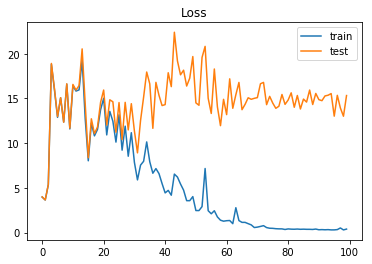

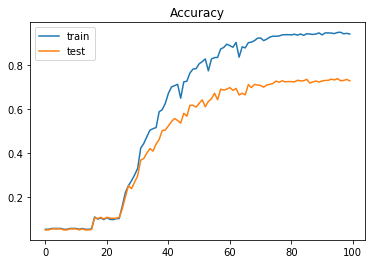

Accuracy: 0.7379255740300871


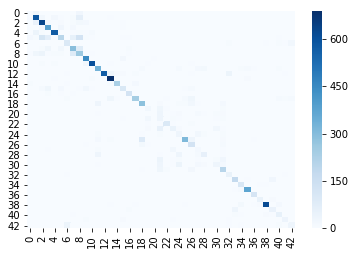

Accuracy: 0.7407224958949097


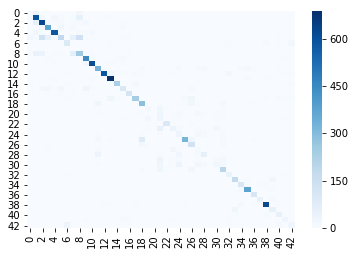

1/100 Epoch, Train/Test Loss: 12.2716/12.1532,         Train/Test Accuracy: 0.0580/0.0546,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.06/6.33 [min]
2/100 Epoch, Train/Test Loss: 17.4020/17.2706,         Train/Test Accuracy: 0.0620/0.0594,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.16/7.86 [min]
3/100 Epoch, Train/Test Loss: 14.4075/14.4334,         Train/Test Accuracy: 0.0580/0.0546,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.21/6.64 [min]
4/100 Epoch, Train/Test Loss: 14.2948/15.0465,         Train/Test Accuracy: 0.0565/0.0570,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.25/6.02 [min]
5/100 Epoch, Train/Test Loss: 13.3373/14.3847,         Train/Test Accuracy: 0.0940/0.0939,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.37/7.01 [min]
6/100 Epoch, Train/Test Loss: 16.7987/17.3310

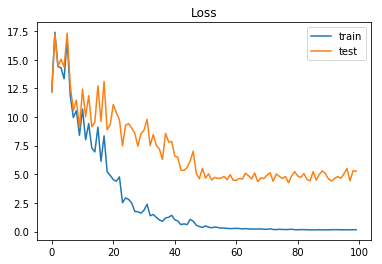

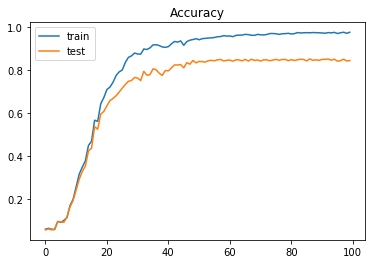

Accuracy: 0.8517022961203484


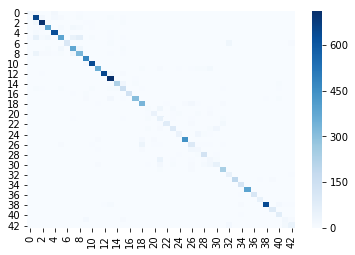

Accuracy: 0.8463054187192118


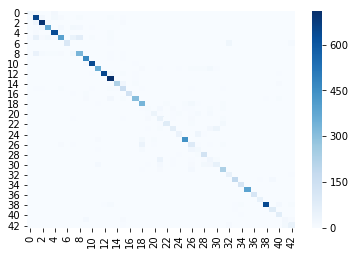

1/100 Epoch, Train/Test Loss: 18.1600/18.1047,         Train/Test Accuracy: 0.0507/0.0546,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.07/7.38 [min]
2/100 Epoch, Train/Test Loss: 14.7626/14.7698,         Train/Test Accuracy: 0.0570/0.0546,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.13/6.29 [min]
3/100 Epoch, Train/Test Loss: 15.3645/15.3265,         Train/Test Accuracy: 0.0650/0.0594,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.25/8.01 [min]
4/100 Epoch, Train/Test Loss: 11.7896/12.0285,         Train/Test Accuracy: 0.0650/0.0594,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.30/7.30 [min]
5/100 Epoch, Train/Test Loss: 16.3653/16.4489,         Train/Test Accuracy: 0.0650/0.0594,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.36/6.87 [min]
6/100 Epoch, Train/Test Loss: 14.7547/15.0425

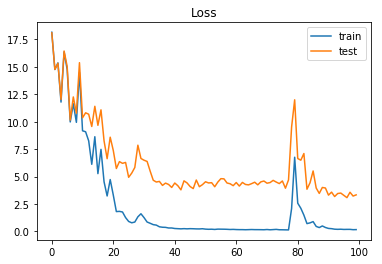

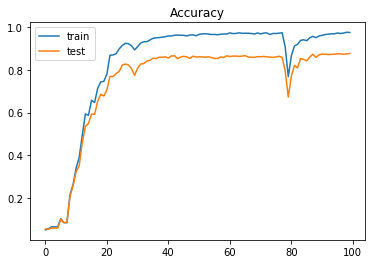

Accuracy: 0.8762470308788599


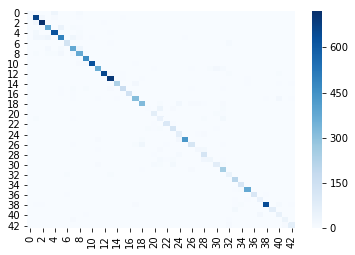

Accuracy: 0.8753694581280789


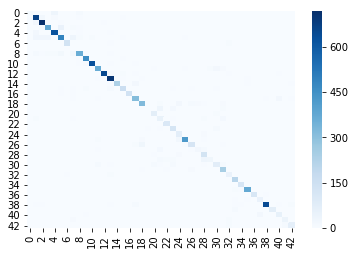

1/100 Epoch, Train/Test Loss: 15.7753/16.0414,         Train/Test Accuracy: 0.0633/0.0594,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.09/8.47 [min]
2/100 Epoch, Train/Test Loss: 5.8652/6.0046,         Train/Test Accuracy: 0.0870/0.0910,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.21/10.14 [min]
3/100 Epoch, Train/Test Loss: 17.1700/17.6344,         Train/Test Accuracy: 0.0958/0.0932,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.32/10.36 [min]
4/100 Epoch, Train/Test Loss: 13.7162/14.1152,         Train/Test Accuracy: 0.1110/0.1170,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.44/10.63 [min]
5/100 Epoch, Train/Test Loss: 11.6301/12.8578,         Train/Test Accuracy: 0.1810/0.1658,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.56/10.67 [min]
6/100 Epoch, Train/Test Loss: 11.3850/13.07

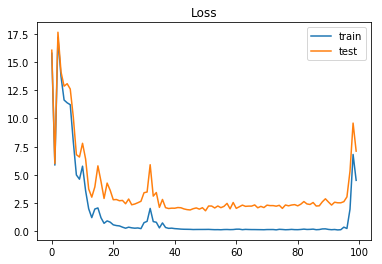

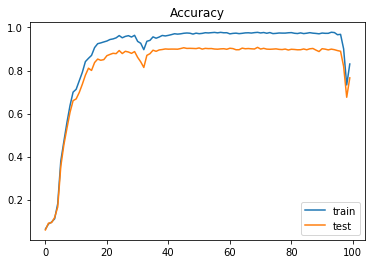

Accuracy: 0.9076009501187648


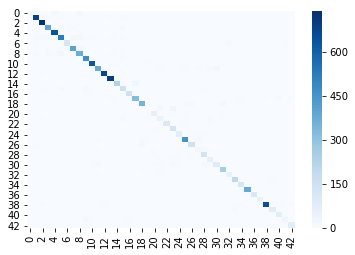

Accuracy: 0.9038587848932677


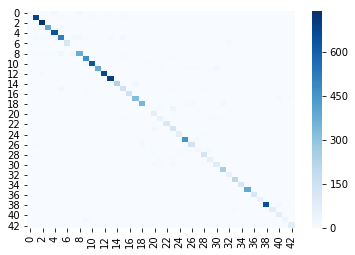

1/100 Epoch, Train/Test Loss: 18.4961/18.4086,         Train/Test Accuracy: 0.0546/0.0546,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.10/9.63 [min]
2/100 Epoch, Train/Test Loss: 14.8029/15.0903,         Train/Test Accuracy: 0.0624/0.0594,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.23/11.13 [min]
3/100 Epoch, Train/Test Loss: 33.7981/33.9512,         Train/Test Accuracy: 0.0888/0.0903,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.36/11.53 [min]
4/100 Epoch, Train/Test Loss: 18.3727/18.4520,         Train/Test Accuracy: 0.1246/0.1309,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.48/11.63 [min]
5/100 Epoch, Train/Test Loss: 14.3837/14.6118,         Train/Test Accuracy: 0.1876/0.1686,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.62/11.77 [min]
6/100 Epoch, Train/Test Loss: 12.5750/13.

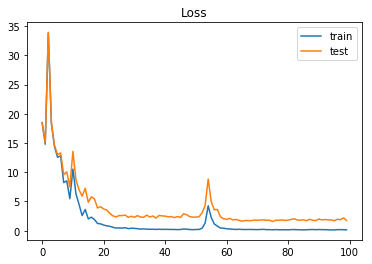

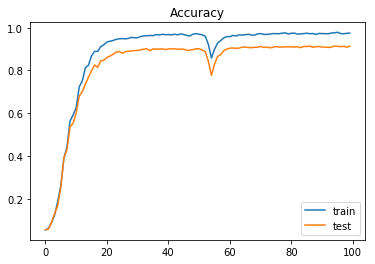

Accuracy: 0.9141726049089469


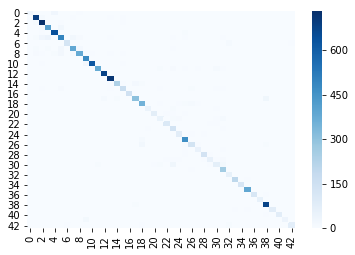

Accuracy: 0.911247947454844


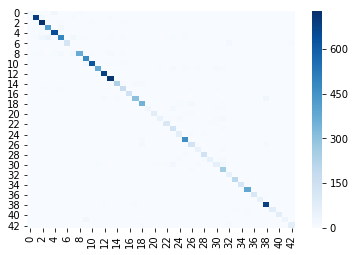

1/100 Epoch, Train/Test Loss: 17.8193/17.7013,         Train/Test Accuracy: 0.0567/0.0570,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.11/10.63 [min]
2/100 Epoch, Train/Test Loss: 13.1838/13.1683,         Train/Test Accuracy: 0.0530/0.0523,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.20/9.56 [min]
3/100 Epoch, Train/Test Loss: 17.6908/17.7212,         Train/Test Accuracy: 0.1292/0.1349,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.33/10.74 [min]
4/100 Epoch, Train/Test Loss: 13.8283/13.9650,         Train/Test Accuracy: 0.2132/0.2111,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.47/11.30 [min]
5/100 Epoch, Train/Test Loss: 10.3334/10.7758,         Train/Test Accuracy: 0.2593/0.2573,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.61/11.56 [min]
6/100 Epoch, Train/Test Loss: 9.0898/9.87

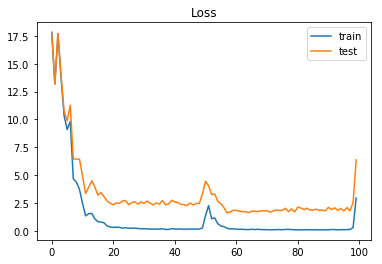

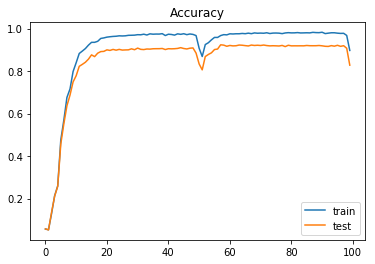

Accuracy: 0.9234362628661916


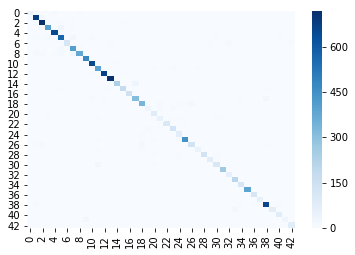

Accuracy: 0.9189655172413793


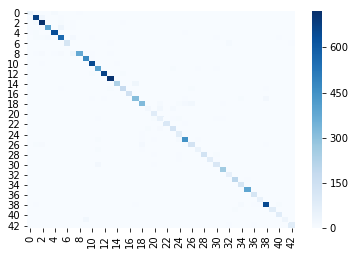

1/100 Epoch, Train/Test Loss: 12.9603/12.8178,         Train/Test Accuracy: 0.0523/0.0523,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.12/11.67 [min]
2/100 Epoch, Train/Test Loss: 14.9044/15.0904,         Train/Test Accuracy: 0.0700/0.0709,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.27/12.99 [min]
3/100 Epoch, Train/Test Loss: 13.1398/13.6035,         Train/Test Accuracy: 0.1913/0.1971,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.41/13.31 [min]
4/100 Epoch, Train/Test Loss: 11.9071/12.6134,         Train/Test Accuracy: 0.3157/0.3089,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.57/13.61 [min]
5/100 Epoch, Train/Test Loss: 12.4364/13.8226,         Train/Test Accuracy: 0.4010/0.3953,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.71/13.58 [min]
6/100 Epoch, Train/Test Loss: 8.8039/10.

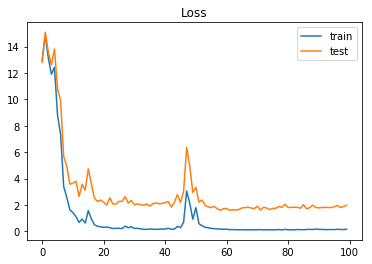

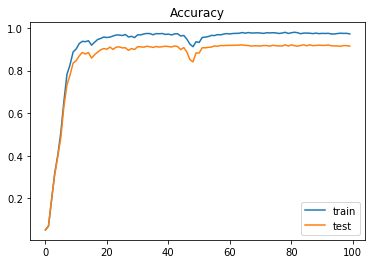

Accuracy: 0.9205859065716548


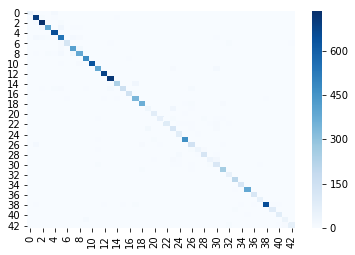

Accuracy: 0.9165024630541871


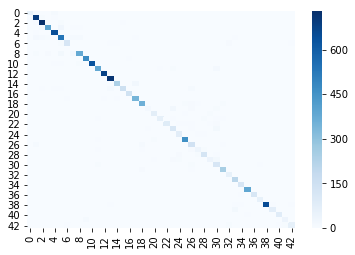

1/100 Epoch, Train/Test Loss: 16.1880/16.0233,         Train/Test Accuracy: 0.0599/0.0594,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.13/12.72 [min]
2/100 Epoch, Train/Test Loss: 8.4332/8.4793,         Train/Test Accuracy: 0.0544/0.0546,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.24/11.71 [min]
3/100 Epoch, Train/Test Loss: 11.7245/11.7008,         Train/Test Accuracy: 0.1181/0.1260,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.40/12.89 [min]
4/100 Epoch, Train/Test Loss: 11.1468/11.3889,         Train/Test Accuracy: 0.2880/0.2899,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.56/13.37 [min]
5/100 Epoch, Train/Test Loss: 11.9098/12.8494,         Train/Test Accuracy: 0.4863/0.4746,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.72/13.63 [min]
6/100 Epoch, Train/Test Loss: 6.3231/7.200

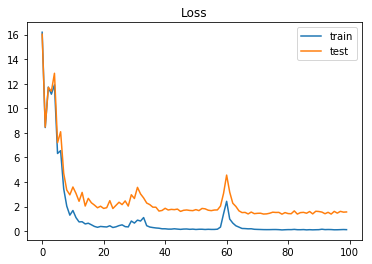

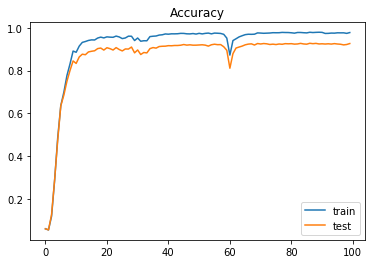

Accuracy: 0.9279493269992082


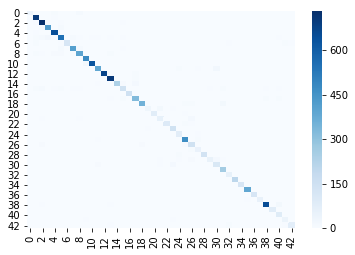

Accuracy: 0.9241379310344827


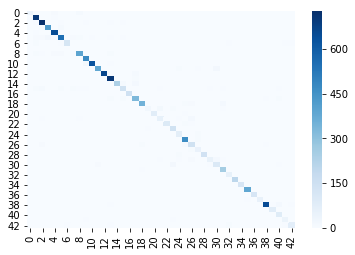

1/100 Epoch, Train/Test Loss: 15.7801/15.5944,         Train/Test Accuracy: 0.0570/0.0570,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.14/13.84 [min]
2/100 Epoch, Train/Test Loss: 14.1981/14.4267,         Train/Test Accuracy: 0.0890/0.0916,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.31/15.34 [min]
3/100 Epoch, Train/Test Loss: 17.5726/17.7968,         Train/Test Accuracy: 0.2199/0.2234,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.48/15.65 [min]
4/100 Epoch, Train/Test Loss: 11.2375/12.0866,         Train/Test Accuracy: 0.4343/0.4211,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.66/15.75 [min]
5/100 Epoch, Train/Test Loss: 8.3707/9.8829,         Train/Test Accuracy: 0.6338/0.6206,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.83/15.71 [min]
6/100 Epoch, Train/Test Loss: 4.3942/5.809

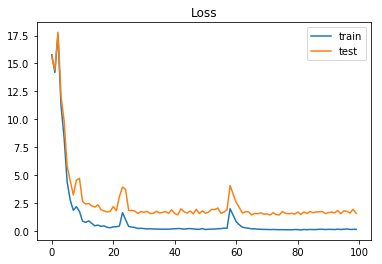

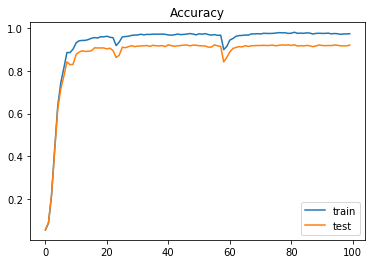

Accuracy: 0.9216943784639746


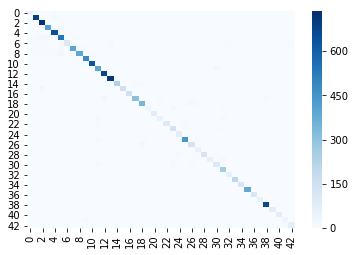

Accuracy: 0.9188834154351396


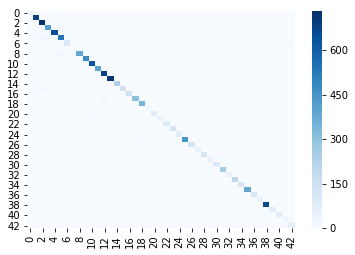

In [6]:
# result output folder
out = os.path.join('results', 'distilled_model')
os.makedirs(os.path.join(out), exist_ok=True)

acc = {'clean_test':[], 'poison_test':[]}
# 1000 to 10000
for N in range(1000, 9000+1, 1000):
    torch.manual_seed(20200705)
    out2 = os.path.join(out, '{}'.format(N))
    os.makedirs(out2, exist_ok=True)

    # Dataset
    train_ds = bd.Dataset_from_array(x=tr['x'][:N], t=tr['t'][:N], transform=transform)
    train_dl = torch.utils.data.DataLoader(train_ds, batch_size=128, shuffle=True)

    # Model
    student_model = net.CNV()
    _ = student_model(dummy_input)

    trainer = bd.distillation.Distillator(train_dl, test_dl, teacher_model, student_model, device)
    optimizer = torch.optim.Adam
    epoch = 100

    # when the training epoch achieved any temp['epoch'], 
    # the temperature is update to corresponding value
    temp = {
        'epoch': np.array([0]),
        't': np.array([20]),
    }

    trainer.run(optimizer, epoch, temp, out2)

    # Save result
    torch.save(student_model.state_dict(), os.path.join(out2, 'final_model.pt'))

    np.savez(os.path.join(out2, 'log.npz'), **trainer.log)

    # Plot and save log figures
    log = np.load(os.path.join(out2, 'log.npz'))
    bd.plot_util.plot_training_logs(log, out2)

    val_model = net.CNV()
    dummy_input = torch.Tensor(np.zeros((1, 3, 32, 32)).astype(np.float32))
    val_model(dummy_input)
    val_model.load_state_dict(torch.load(os.path.join(out2, 'best_model.pt')))
    val_model = val_model.eval()

    evaluator = bd.Evaluator(val_model, 43, device=device)

    # Evaluation against clean dataset
    ret = evaluator.run(
        test_dl,
        out=os.path.join(out2, 'clean_test'),
        cmap='Blues',
        fmt='d',
        annot=False,
        cbar=True
    )
    acc['clean_test'].append(ret[1])

    # Evaluation against poison dataset
    ret = evaluator.run(
        test_p_dl,
        out=os.path.join(out2, 'poison_test'),
        cmap='Blues',
        fmt='d',
        annot=False,
        cbar=True
    )
    acc['poison_test'].append(ret[1])

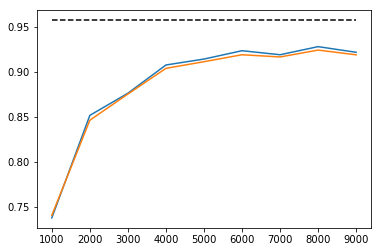

In [12]:
np.savez(os.path.join(out, 'log.npz'), **acc)

baseline_log = np.load(os.path.join('results', 'baseline_model', 'clean_test.npz'))
plt.plot(range(1000, 9000+1, 1000), np.ones(9)*baseline_log['accuracy'], 'k--')
plt.plot(range(1000, 9000+1, 1000), acc['clean_test'])
plt.plot(range(1000, 9000+1, 1000), acc['poison_test'])
plt.show()

### スクリーニング

In [5]:
backdoor_path = os.path.join('results', 'backdoor_model')
backdoor_model = net.CNV()
dummy_input = torch.Tensor(np.zeros((1, 3, 32, 32)).astype(np.float32))
_ = backdoor_model(dummy_input)
backdoor_model.load_state_dict(torch.load(os.path.join(backdoor_path, 'best_model.pt')))
backdoor_model = backdoor_model.eval()

precision    recall  f1-score   support

       False       0.78      1.00      0.88     23421
        True       1.00      0.01      0.02      6579

   micro avg       0.78      0.78      0.78     30000
   macro avg       0.89      0.50      0.45     30000
weighted avg       0.83      0.78      0.69     30000



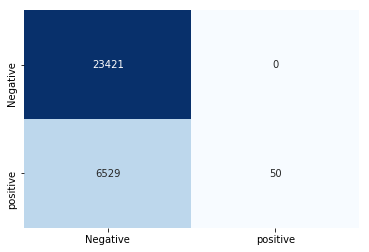

precision    recall  f1-score   support

       False       0.89      1.00      0.94     26781
        True       1.00      0.02      0.03      3219

   micro avg       0.89      0.89      0.89     30000
   macro avg       0.95      0.51      0.49     30000
weighted avg       0.91      0.89      0.85     30000



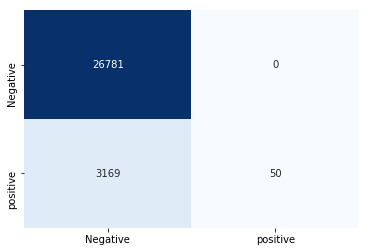

precision    recall  f1-score   support

       False       0.93      1.00      0.96     27704
        True       1.00      0.02      0.04      2296

   micro avg       0.93      0.93      0.93     30000
   macro avg       0.96      0.51      0.50     30000
weighted avg       0.93      0.93      0.89     30000



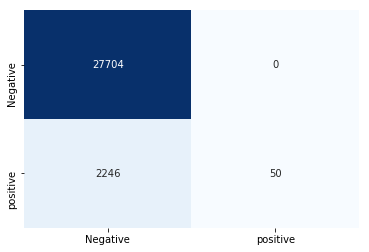

precision    recall  f1-score   support

       False       0.95      1.00      0.97     28442
        True       1.00      0.03      0.06      1558

   micro avg       0.95      0.95      0.95     30000
   macro avg       0.97      0.52      0.52     30000
weighted avg       0.95      0.95      0.93     30000



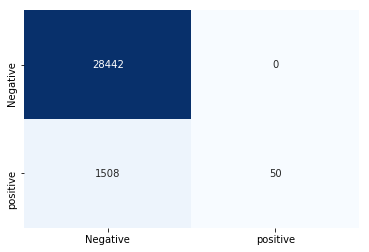

precision    recall  f1-score   support

       False       0.95      1.00      0.97     28441
        True       1.00      0.03      0.06      1559

   micro avg       0.95      0.95      0.95     30000
   macro avg       0.97      0.52      0.52     30000
weighted avg       0.95      0.95      0.93     30000



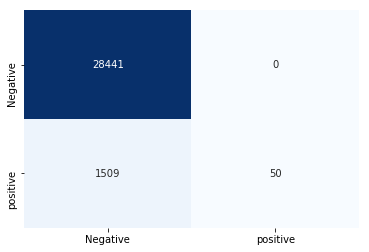

precision    recall  f1-score   support

       False       0.96      1.00      0.98     28671
        True       1.00      0.04      0.07      1329

   micro avg       0.96      0.96      0.96     30000
   macro avg       0.98      0.52      0.53     30000
weighted avg       0.96      0.96      0.94     30000



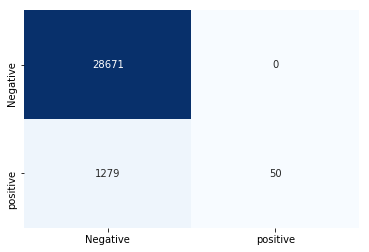

precision    recall  f1-score   support

       False       0.96      1.00      0.98     28812
        True       1.00      0.04      0.08      1188

   micro avg       0.96      0.96      0.96     30000
   macro avg       0.98      0.52      0.53     30000
weighted avg       0.96      0.96      0.94     30000



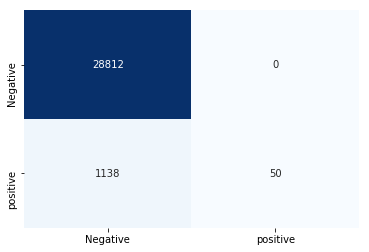

precision    recall  f1-score   support

       False       0.97      1.00      0.98     28935
        True       1.00      0.05      0.09      1065

   micro avg       0.97      0.97      0.97     30000
   macro avg       0.98      0.52      0.54     30000
weighted avg       0.97      0.97      0.95     30000



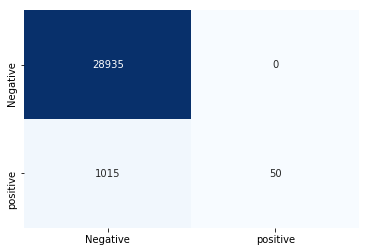

precision    recall  f1-score   support

       False       0.97      1.00      0.98     29019
        True       1.00      0.05      0.10       981

   micro avg       0.97      0.97      0.97     30000
   macro avg       0.98      0.53      0.54     30000
weighted avg       0.97      0.97      0.96     30000



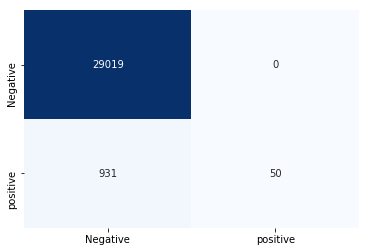

In [6]:
# Dataset
tr = np.load(os.path.join(ds_root, 'poison_training_dataset.npz'))
train_ds = bd.Dataset_from_array(x=tr['x'], t=tr['t'], transform=transform)
train_dl = torch.utils.data.DataLoader(train_ds, batch_size=128, shuffle=False)

# result output folder
out = os.path.join('results', 'screening')
os.makedirs(os.path.join(out), exist_ok=True)

res = {'Recall':[], 'FP':[], 'Precision':[]}
# 1000 to 10000
for N in range(1000, 9000+1, 1000):
    out2 = os.path.join(out, '{}'.format(N))
    os.makedirs(out2, exist_ok=True)

    # Distilled Model
    distilled_path = os.path.join('results', 'distilled_model', '{}'.format(N))
    distilled_model = net.CNV()
    dummy_input = torch.Tensor(np.zeros((1, 3, 32, 32)).astype(np.float32))
    _ = distilled_model(dummy_input)
    distilled_model.load_state_dict(torch.load(os.path.join(distilled_path, 'best_model.pt')))
    distilled_model = distilled_model.eval()

    screening = bd.distillation.Dataset_screening(train_dl, backdoor_model, distilled_model, device=device)
    screening.run()
    negative_dataset = screening.negative_dataset
    positive_dataset = screening.positive_dataset
    np.savez(os.path.join(out2, 'screening_negative_dataset.npz'), x=negative_dataset['x'], t=negative_dataset['t'])

    confmat, report = screening.eval(tr['t_correct'])
    print(report)
    bd.plot_util.plot_confusion_matrix(
        confmat,
        cmap='Blues',
        fmt='d',
        annot=True,
        cbar=False,
        xticklabels=['Negative', 'positive'],
        yticklabels=['Negative', 'positive']
    )

    np.savez(
        os.path.join(out2, 'result.npz'),
        negative_dataset = negative_dataset,
        positive_dataset = positive_dataset,
        confmat = confmat,
        report = report
    )

    TP = confmat[1,1]
    FN = confmat[0,1]
    FP = confmat[1,0]
    Recall = TP/(TP+FN)
    Precision = TP/(TP+FP)
    res['Recall'].append(Recall)
    res['Precision'].append(Precision)
    res['FP'].append(FP)

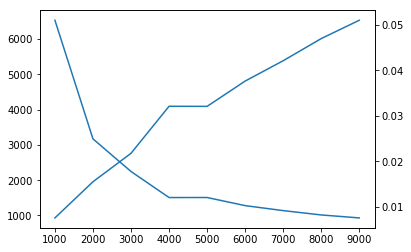

In [7]:
np.savez(os.path.join(out, 'log.npz'), **res)
fig = plt.figure()
ax = fig.add_subplot(111)
ax2 = ax.twinx()
ax.plot(range(1000, 9000+1, 1000), res['FP'])
ax2.plot(range(1000, 9000+1, 1000), res['Precision'])
plt.show()

### Fine-tuning

1/50 Epoch, Train/Test Loss: 0.0819/1.0910,         Train/Test Accuracy: 0.9742/0.8003,         Elapsed/Remaining time: 0.24/11.70 [min]
2/50 Epoch, Train/Test Loss: 0.0419/1.2458,         Train/Test Accuracy: 0.9878/0.8218,         Elapsed/Remaining time: 0.48/11.41 [min]
3/50 Epoch, Train/Test Loss: 0.0404/1.1543,         Train/Test Accuracy: 0.9882/0.8242,         Elapsed/Remaining time: 0.72/11.31 [min]
4/50 Epoch, Train/Test Loss: 0.0298/1.0743,         Train/Test Accuracy: 0.9912/0.8430,         Elapsed/Remaining time: 0.97/11.17 [min]
5/50 Epoch, Train/Test Loss: 0.0164/1.1317,         Train/Test Accuracy: 0.9953/0.8359,         Elapsed/Remaining time: 1.16/10.42 [min]
6/50 Epoch, Train/Test Loss: 0.0126/1.0918,         Train/Test Accuracy: 0.9967/0.8458,         Elapsed/Remaining time: 1.41/10.32 [min]
7/50 Epoch, Train/Test Loss: 0.0172/1.0817,         Train/Test Accuracy: 0.9951/0.8445,         Elapsed/Remaining time: 1.58/9.73 [min]
8/50 Epoch, Train/Test Loss: 0.0421/1.0530

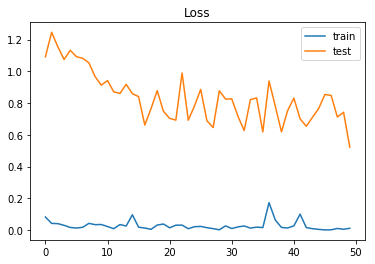

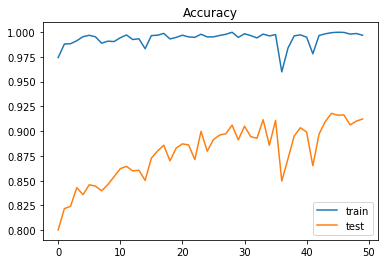

Accuracy: 0.9178939034045922


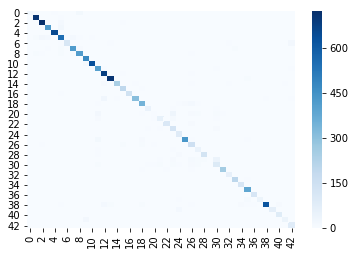

Accuracy: 0.9118226600985222


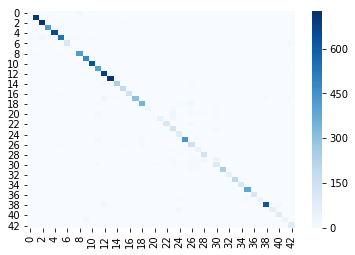

1/50 Epoch, Train/Test Loss: 0.0457/0.6111,         Train/Test Accuracy: 0.9872/0.8814,         Elapsed/Remaining time: 0.22/10.79 [min]
2/50 Epoch, Train/Test Loss: 0.0474/0.6645,         Train/Test Accuracy: 0.9886/0.8800,         Elapsed/Remaining time: 0.42/9.99 [min]
3/50 Epoch, Train/Test Loss: 0.0368/0.6315,         Train/Test Accuracy: 0.9907/0.8865,         Elapsed/Remaining time: 0.67/10.47 [min]
4/50 Epoch, Train/Test Loss: 0.0175/0.5607,         Train/Test Accuracy: 0.9951/0.8958,         Elapsed/Remaining time: 0.93/10.68 [min]
5/50 Epoch, Train/Test Loss: 0.0244/0.5410,         Train/Test Accuracy: 0.9940/0.9020,         Elapsed/Remaining time: 1.19/10.72 [min]
6/50 Epoch, Train/Test Loss: 0.0299/0.5419,         Train/Test Accuracy: 0.9915/0.8983,         Elapsed/Remaining time: 1.39/10.18 [min]
7/50 Epoch, Train/Test Loss: 0.0165/0.5262,         Train/Test Accuracy: 0.9956/0.9114,         Elapsed/Remaining time: 1.65/10.11 [min]
8/50 Epoch, Train/Test Loss: 0.0417/0.4986

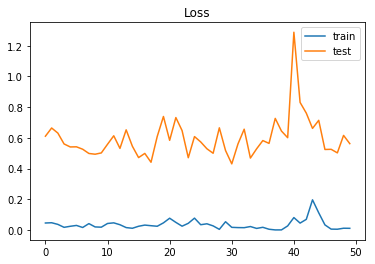

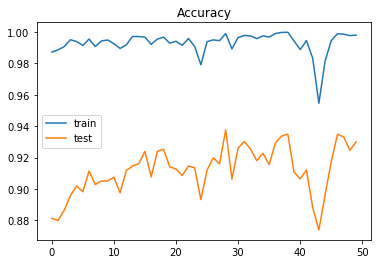

Accuracy: 0.9376880443388756


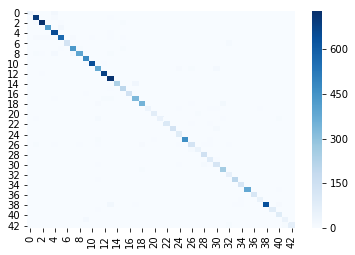

Accuracy: 0.9343185550082101


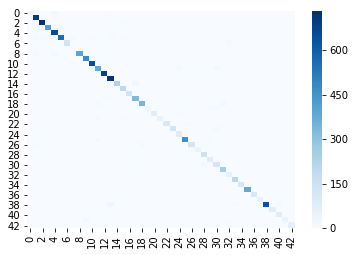

1/50 Epoch, Train/Test Loss: 0.0958/0.7877,         Train/Test Accuracy: 0.9800/0.8769,         Elapsed/Remaining time: 0.24/11.63 [min]
2/50 Epoch, Train/Test Loss: 0.0604/0.6663,         Train/Test Accuracy: 0.9854/0.8877,         Elapsed/Remaining time: 0.51/12.28 [min]
3/50 Epoch, Train/Test Loss: 0.0108/0.5999,         Train/Test Accuracy: 0.9968/0.9127,         Elapsed/Remaining time: 0.78/12.22 [min]
4/50 Epoch, Train/Test Loss: 0.0143/0.6892,         Train/Test Accuracy: 0.9965/0.9139,         Elapsed/Remaining time: 1.05/12.13 [min]
5/50 Epoch, Train/Test Loss: 0.0301/0.8103,         Train/Test Accuracy: 0.9938/0.8986,         Elapsed/Remaining time: 1.27/11.43 [min]
6/50 Epoch, Train/Test Loss: 0.0548/0.4974,         Train/Test Accuracy: 0.9866/0.9016,         Elapsed/Remaining time: 1.48/10.85 [min]
7/50 Epoch, Train/Test Loss: 0.0285/0.5718,         Train/Test Accuracy: 0.9923/0.9015,         Elapsed/Remaining time: 1.68/10.34 [min]
8/50 Epoch, Train/Test Loss: 0.0325/0.533

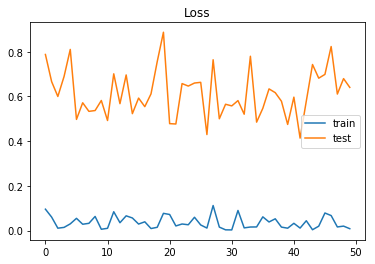

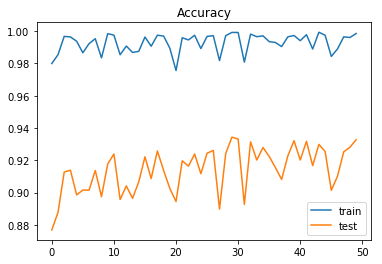

Accuracy: 0.9343626286619161


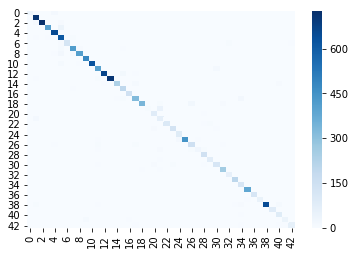

Accuracy: 0.9329228243021347


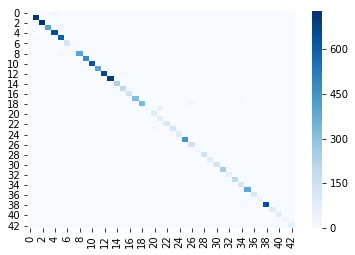

1/50 Epoch, Train/Test Loss: 0.0501/0.4525,         Train/Test Accuracy: 0.9865/0.9106,         Elapsed/Remaining time: 0.24/11.80 [min]
2/50 Epoch, Train/Test Loss: 0.0224/0.4638,         Train/Test Accuracy: 0.9944/0.9170,         Elapsed/Remaining time: 0.52/12.51 [min]
3/50 Epoch, Train/Test Loss: 0.0210/0.3977,         Train/Test Accuracy: 0.9937/0.9277,         Elapsed/Remaining time: 0.80/12.49 [min]
4/50 Epoch, Train/Test Loss: 0.0377/0.4151,         Train/Test Accuracy: 0.9909/0.9174,         Elapsed/Remaining time: 1.01/11.56 [min]
5/50 Epoch, Train/Test Loss: 0.0142/0.3647,         Train/Test Accuracy: 0.9962/0.9260,         Elapsed/Remaining time: 1.21/10.93 [min]
6/50 Epoch, Train/Test Loss: 0.1049/0.7264,         Train/Test Accuracy: 0.9782/0.9006,         Elapsed/Remaining time: 1.42/10.44 [min]
7/50 Epoch, Train/Test Loss: 0.0198/0.4291,         Train/Test Accuracy: 0.9950/0.9237,         Elapsed/Remaining time: 1.63/10.04 [min]
8/50 Epoch, Train/Test Loss: 0.0647/0.427

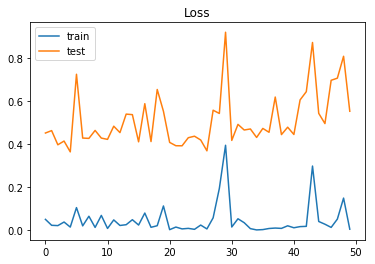

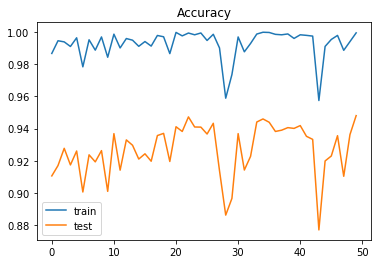

Accuracy: 0.9479809976247031


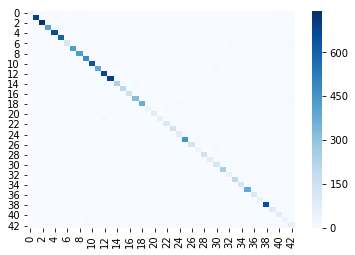

Accuracy: 0.94376026272578


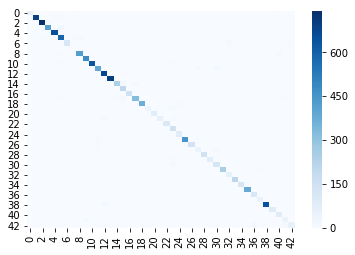

1/50 Epoch, Train/Test Loss: 0.0582/0.5748,         Train/Test Accuracy: 0.9894/0.9144,         Elapsed/Remaining time: 0.24/11.58 [min]
2/50 Epoch, Train/Test Loss: 0.0377/0.5653,         Train/Test Accuracy: 0.9905/0.9192,         Elapsed/Remaining time: 0.50/11.98 [min]
3/50 Epoch, Train/Test Loss: 0.0177/0.5100,         Train/Test Accuracy: 0.9965/0.9274,         Elapsed/Remaining time: 0.76/11.92 [min]
4/50 Epoch, Train/Test Loss: 0.0591/0.4453,         Train/Test Accuracy: 0.9861/0.9169,         Elapsed/Remaining time: 0.97/11.14 [min]
5/50 Epoch, Train/Test Loss: 0.0264/0.5215,         Train/Test Accuracy: 0.9949/0.9227,         Elapsed/Remaining time: 1.18/10.59 [min]
6/50 Epoch, Train/Test Loss: 0.0612/0.6141,         Train/Test Accuracy: 0.9886/0.9104,         Elapsed/Remaining time: 1.39/10.16 [min]
7/50 Epoch, Train/Test Loss: 0.0845/0.5403,         Train/Test Accuracy: 0.9924/0.9179,         Elapsed/Remaining time: 1.61/9.87 [min]
8/50 Epoch, Train/Test Loss: 0.0178/0.5184

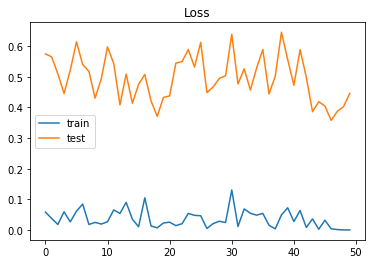

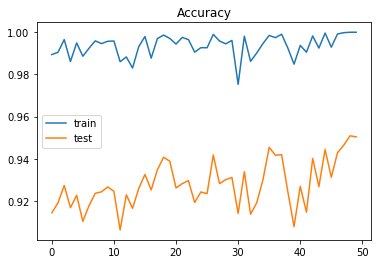

Accuracy: 0.950910530482977


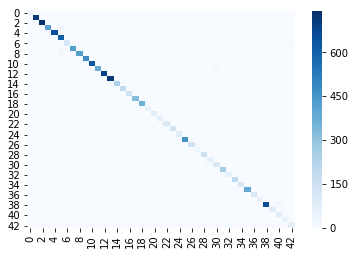

Accuracy: 0.9472085385878489


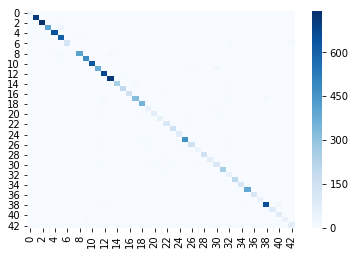

1/50 Epoch, Train/Test Loss: 0.1213/0.5481,         Train/Test Accuracy: 0.9723/0.8969,         Elapsed/Remaining time: 0.24/11.66 [min]
2/50 Epoch, Train/Test Loss: 0.0636/0.4188,         Train/Test Accuracy: 0.9853/0.9167,         Elapsed/Remaining time: 0.51/12.26 [min]
3/50 Epoch, Train/Test Loss: 0.0555/0.4445,         Train/Test Accuracy: 0.9869/0.9133,         Elapsed/Remaining time: 0.72/11.28 [min]
4/50 Epoch, Train/Test Loss: 0.0304/0.4649,         Train/Test Accuracy: 0.9932/0.9284,         Elapsed/Remaining time: 0.98/11.29 [min]
5/50 Epoch, Train/Test Loss: 0.0992/0.4418,         Train/Test Accuracy: 0.9864/0.9151,         Elapsed/Remaining time: 1.20/10.82 [min]
6/50 Epoch, Train/Test Loss: 0.0363/0.5083,         Train/Test Accuracy: 0.9918/0.9239,         Elapsed/Remaining time: 1.42/10.45 [min]
7/50 Epoch, Train/Test Loss: 0.0296/0.4419,         Train/Test Accuracy: 0.9937/0.9295,         Elapsed/Remaining time: 1.70/10.46 [min]
8/50 Epoch, Train/Test Loss: 0.0077/0.454

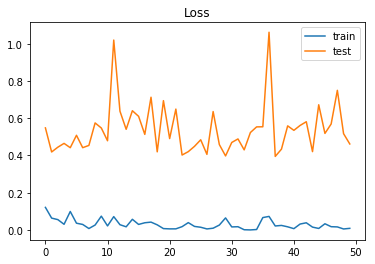

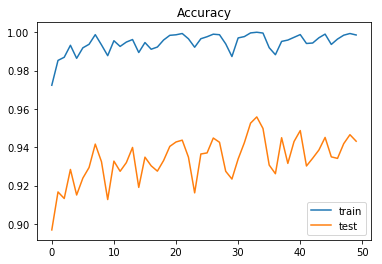

Accuracy: 0.9558194774346793


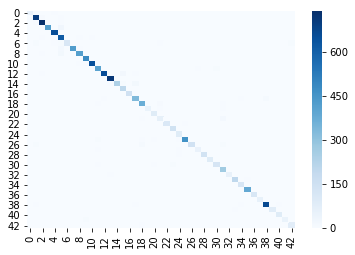

Accuracy: 0.9521346469622332


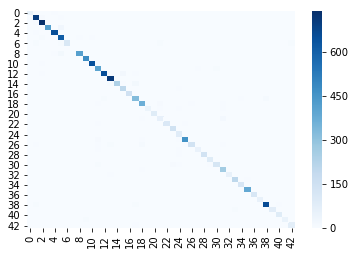

1/50 Epoch, Train/Test Loss: 0.0683/0.5288,         Train/Test Accuracy: 0.9889/0.9236,         Elapsed/Remaining time: 0.23/11.20 [min]
2/50 Epoch, Train/Test Loss: 0.1107/0.4686,         Train/Test Accuracy: 0.9858/0.9158,         Elapsed/Remaining time: 0.44/10.53 [min]
3/50 Epoch, Train/Test Loss: 0.0286/0.5600,         Train/Test Accuracy: 0.9949/0.9306,         Elapsed/Remaining time: 0.71/11.05 [min]
4/50 Epoch, Train/Test Loss: 0.0767/0.6262,         Train/Test Accuracy: 0.9858/0.9103,         Elapsed/Remaining time: 0.92/10.53 [min]
5/50 Epoch, Train/Test Loss: 0.0137/0.3876,         Train/Test Accuracy: 0.9977/0.9389,         Elapsed/Remaining time: 1.18/10.60 [min]
6/50 Epoch, Train/Test Loss: 0.0330/0.4440,         Train/Test Accuracy: 0.9915/0.9151,         Elapsed/Remaining time: 1.39/10.22 [min]
7/50 Epoch, Train/Test Loss: 0.0079/0.3903,         Train/Test Accuracy: 0.9982/0.9401,         Elapsed/Remaining time: 1.66/10.21 [min]
8/50 Epoch, Train/Test Loss: 0.0092/0.425

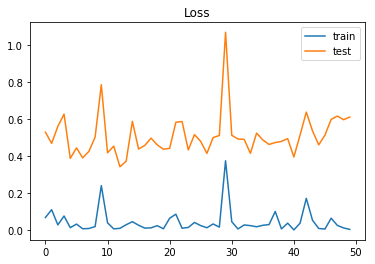

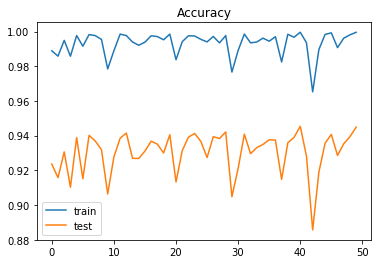

Accuracy: 0.9453681710213777


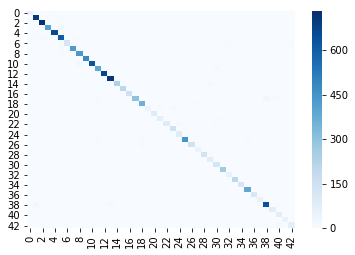

Accuracy: 0.9412151067323481


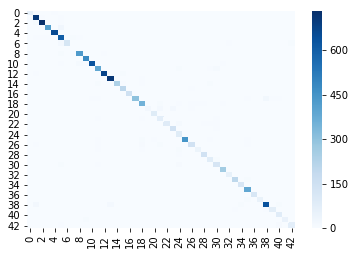

1/50 Epoch, Train/Test Loss: 0.0524/0.5648,         Train/Test Accuracy: 0.9879/0.9207,         Elapsed/Remaining time: 0.24/11.87 [min]
2/50 Epoch, Train/Test Loss: 0.0226/0.3841,         Train/Test Accuracy: 0.9950/0.9383,         Elapsed/Remaining time: 0.52/12.55 [min]
3/50 Epoch, Train/Test Loss: 0.0448/0.5004,         Train/Test Accuracy: 0.9936/0.9315,         Elapsed/Remaining time: 0.75/11.69 [min]
4/50 Epoch, Train/Test Loss: 0.0401/0.4847,         Train/Test Accuracy: 0.9922/0.9222,         Elapsed/Remaining time: 0.96/11.04 [min]
5/50 Epoch, Train/Test Loss: 0.0176/0.5078,         Train/Test Accuracy: 0.9949/0.9305,         Elapsed/Remaining time: 1.17/10.57 [min]
6/50 Epoch, Train/Test Loss: 0.0167/0.5388,         Train/Test Accuracy: 0.9961/0.9320,         Elapsed/Remaining time: 1.39/10.18 [min]
7/50 Epoch, Train/Test Loss: 0.1215/0.5987,         Train/Test Accuracy: 0.9856/0.9192,         Elapsed/Remaining time: 1.60/9.84 [min]
8/50 Epoch, Train/Test Loss: 0.0146/0.4175

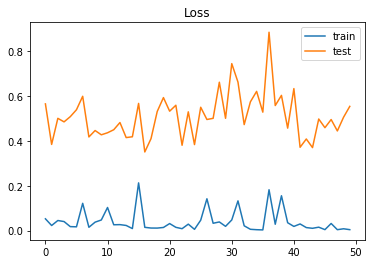

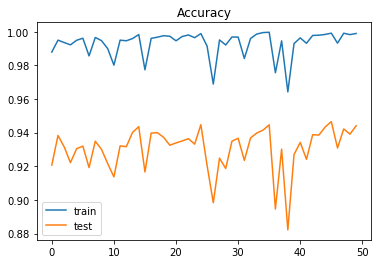

Accuracy: 0.9465558194774347


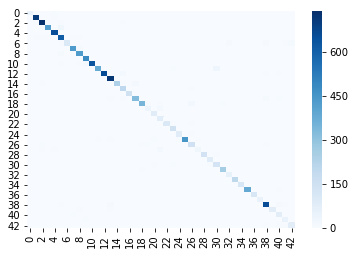

Accuracy: 0.942200328407225


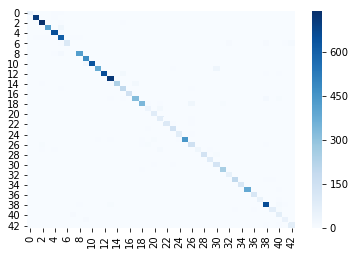

1/50 Epoch, Train/Test Loss: 0.0952/0.4812,         Train/Test Accuracy: 0.9764/0.9068,         Elapsed/Remaining time: 0.24/11.92 [min]
2/50 Epoch, Train/Test Loss: 0.0189/0.4887,         Train/Test Accuracy: 0.9959/0.9259,         Elapsed/Remaining time: 0.52/12.44 [min]
3/50 Epoch, Train/Test Loss: 0.0420/0.5921,         Train/Test Accuracy: 0.9929/0.9216,         Elapsed/Remaining time: 0.73/11.45 [min]
4/50 Epoch, Train/Test Loss: 0.0316/0.4979,         Train/Test Accuracy: 0.9930/0.9262,         Elapsed/Remaining time: 1.00/11.47 [min]
5/50 Epoch, Train/Test Loss: 0.0241/0.5208,         Train/Test Accuracy: 0.9949/0.9308,         Elapsed/Remaining time: 1.26/11.35 [min]
6/50 Epoch, Train/Test Loss: 0.0183/0.4340,         Train/Test Accuracy: 0.9960/0.9239,         Elapsed/Remaining time: 1.49/10.90 [min]
7/50 Epoch, Train/Test Loss: 0.0095/0.4299,         Train/Test Accuracy: 0.9982/0.9335,         Elapsed/Remaining time: 1.75/10.78 [min]
8/50 Epoch, Train/Test Loss: 0.0303/0.464

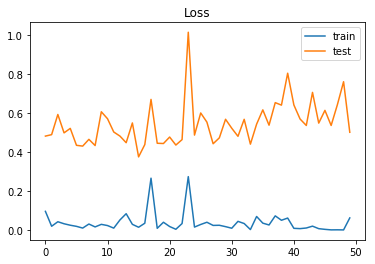

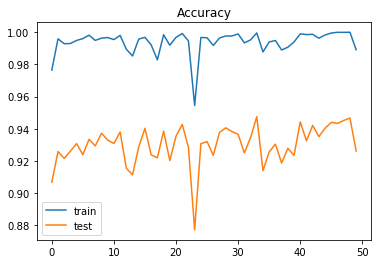

Accuracy: 0.9475851148060174


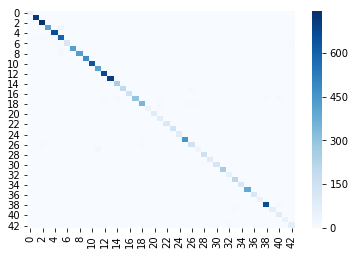

Accuracy: 0.946551724137931


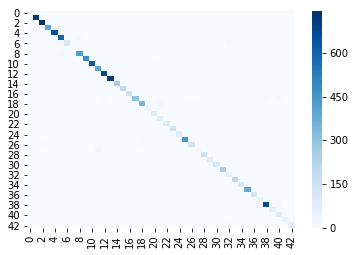

In [8]:
# result output folder
out = os.path.join('results', 'fine_tuned_model')
os.makedirs(os.path.join(out), exist_ok=True)

acc = {'clean_test':[], 'poison_test':[]}
# 1000 to 9000
for N in range(1000, 9000+1, 1000):
    torch.manual_seed(20200705)
    out2 = os.path.join(out, '{}'.format(N))
    os.makedirs(out2, exist_ok=True)

    ds_root = os.path.join('.', 'results', 'datasets')
    tr = np.load(os.path.join('.', 'results', 'screening', '{}'.format(N), 'screening_negative_dataset.npz'))
    train_ds = bd.Dataset_from_array(x=tr['x'], t=tr['t'], transform=transform)
    train_dl = torch.utils.data.DataLoader(train_ds, batch_size=256, shuffle=True)

    # Model
    model = net.CNV()
    dummy_input = torch.Tensor(np.zeros((1, 3, 32, 32)).astype(np.float32))
    model(dummy_input)
    model.load_state_dict(torch.load(os.path.join('results', 'distilled_model', '{}'.format(N), 'best_model.pt')))
    model = model.eval()

    # Train
    trainer = bd.Trainer(train_dl, test_dl, model, device)
    optimizer = torch.optim.Adam
    epoch = 50

    trainer.run(optimizer, epoch, out2)

    # Save result
    torch.save(model.state_dict(), os.path.join(out2, 'final_model.pt'))

    np.savez(os.path.join(out2, 'log.npz'), **trainer.log)

    # Plot and save log figures
    log = np.load(os.path.join(out2, 'log.npz'))
    bd.plot_util.plot_training_logs(log, out2)

    val_model = net.CNV()
    dummy_input = torch.Tensor(np.zeros((1, 3, 32, 32)).astype(np.float32))
    val_model(dummy_input)
    val_model.load_state_dict(torch.load(os.path.join(out2, 'best_model.pt')))
    val_model = val_model.eval()

    evaluator = bd.Evaluator(val_model, 43, device=device)

    # Evaluation against clean dataset
    ret = evaluator.run(
        test_dl,
        out=os.path.join(out2, 'clean_test'),
        cmap='Blues',
        fmt='d',
        annot=False,
        cbar=True
    )
    acc['clean_test'].append(ret[1])

    # Evaluation against poison dataset
    ret = evaluator.run(
        test_p_dl,
        out=os.path.join(out2, 'poison_test'),
        cmap='Blues',
        fmt='d',
        annot=False,
        cbar=True
    )
    acc['poison_test'].append(ret[1])

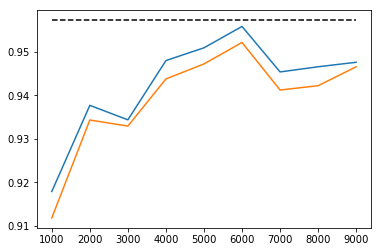

In [9]:
np.savez(os.path.join(out, 'log.npz'), **acc)

baseline_log = np.load(os.path.join('results', 'baseline_model', 'clean_test.npz'))
plt.plot(range(1000, 9000+1, 1000), np.ones(9)*baseline_log['accuracy'], 'k--')
plt.plot(range(1000, 9000+1, 1000), acc['clean_test'])
plt.plot(range(1000, 9000+1, 1000), acc['poison_test'])
#plt.ylim(0.9, 1.01)
plt.show()

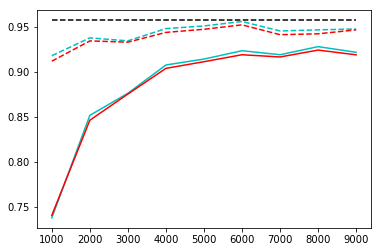

In [13]:
baseline_clean = np.load(os.path.join('results', 'baseline_model', 'clean_test.npz'))
#baseline_poison = 
distill = np.load(os.path.join('results', 'distilled_model', 'log.npz'))
fine_tune = np.load(os.path.join('results', 'fine_tuned_model', 'log.npz'))


plt.plot(range(1000, 9000+1, 1000), np.ones(9)*baseline_clean['accuracy'], 'k--')
plt.plot(range(1000, 9000+1, 1000), distill['clean_test'], 'c')
plt.plot(range(1000, 9000+1, 1000), distill['poison_test'], 'r')
plt.plot(range(1000, 9000+1, 1000), fine_tune['clean_test'], 'c--')
plt.plot(range(1000, 9000+1, 1000), fine_tune['poison_test'], 'r--')
plt.show()